In [1]:
from tensorflow import lite
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import pandas as pd
import random, os
import shutil
import time
import itertools
import pathlib
import matplotlib.pyplot as plt 
from matplotlib.image import imread

from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score
from sklearn.ensemble import BaggingClassifier


from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.metrics import categorical_accuracy 
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers, models
from tensorflow.keras.applications import EfficientNetB3, EfficientNetB4, EfficientNetB5
from sklearn.model_selection import KFold

from torch import nn


import xgboost as xgb


# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

In [2]:
save_path = "C:/Users/Aum Sathwara/Documents/Aum/Workplace/Python/PROJECTS/Deep Learning Project"

In [3]:
data_dir = "F:/Deep Learning/Diabetic Retinopathy/gaussian_filtered_images/gaussian_filtered_images"
filepaths = []
labels = []

In [4]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
folds = os.listdir(data_dir)
print(folds)

Num GPUs Available:  1
['Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe']


In [5]:
for fold in folds:
    foldpath = os.path.join(data_dir, fold)
    if pathlib.Path(foldpath).suffix == "":
        filelist = os.listdir(foldpath)
        
        for file in filelist:
            fpath = os.path.join(foldpath, file)
            filepaths.append(fpath)
#             print(filepaths)
            labels.append(fold)
#             print(labels)

In [6]:
Fseries = pd.Series(filepaths, name = "filepaths")
Lseries = pd.Series(labels, name="labels")
df = pd.concat([Fseries, Lseries], axis=1)

In [7]:
print(df)

                                              filepaths  labels
0     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
1     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
2     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
3     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
4     F:/Deep Learning/Diabetic Retinopathy/gaussian...    Mild
...                                                 ...     ...
3657  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3658  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3659  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3660  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe
3661  F:/Deep Learning/Diabetic Retinopathy/gaussian...  Severe

[3662 rows x 2 columns]


In [8]:
train_df, dummy_df = train_test_split(df, train_size=0.8 , shuffle= True, random_state=123)
valid_df, test_df = train_test_split(dummy_df, train_size=0.6, shuffle=True, random_state= 123)

In [9]:
batch_size = 32
img_size = (224,224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

In [10]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length+1) if ts_length%n == 0 and ts_length/n <=80]))
test_steps = ts_length // test_batch_size

In [11]:
def scaler(img):
    return img

In [12]:
tr_gen = ImageDataGenerator(preprocessing_function=scaler)
ts_gen = ImageDataGenerator(preprocessing_function=scaler)

In [13]:
train_gen = tr_gen.flow_from_dataframe(dataframe=train_df, 
                                       x_col="filepaths" , 
                                       y_col="labels", 
                                       target_size=img_size, 
                                       class_mode='categorical', 
                                       color_mode="rgb", 
                                       shuffle=True, 
                                       batch_size=batch_size)

Found 2929 validated image filenames belonging to 5 classes.


In [14]:
valid_gen = ts_gen.flow_from_dataframe(dataframe=valid_df, 
                                       x_col="filepaths" , 
                                       y_col="labels", 
                                       target_size=img_size, 
                                       class_mode='categorical', 
                                       color_mode="rgb", 
                                       shuffle=True, 
                                       batch_size=batch_size)

Found 439 validated image filenames belonging to 5 classes.


In [15]:
test_gen = ts_gen.flow_from_dataframe(dataframe=test_df, 
                                       x_col="filepaths" , 
                                       y_col="labels", 
                                       target_size=img_size, 
                                       class_mode='categorical', 
                                       color_mode="rgb", 
                                       shuffle=True, 
                                       batch_size=batch_size)

Found 294 validated image filenames belonging to 5 classes.


In [16]:
g_dict = train_gen.class_indices
classes = list(g_dict.keys())
images, labels = next(train_gen)

In [17]:
length = len(labels)
sample = min(length, 25) 

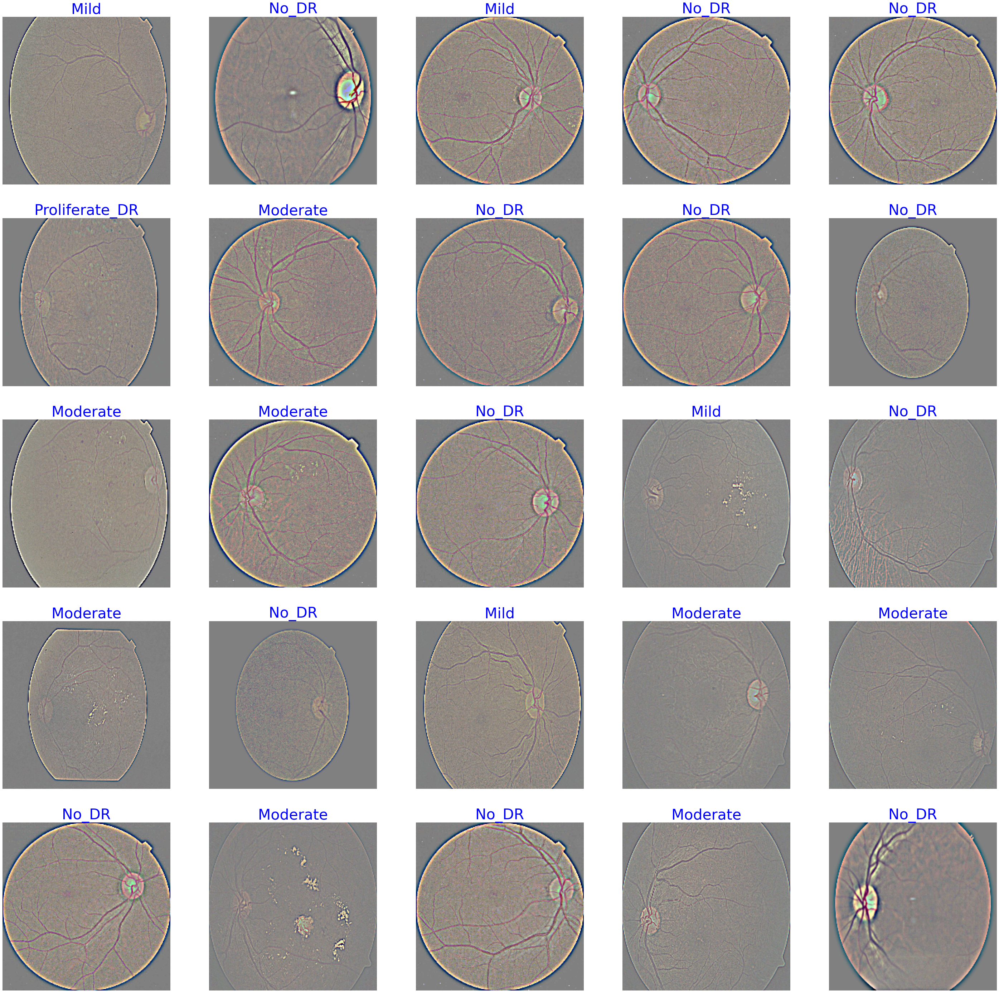

In [18]:
plt.figure(figsize= (50,50))
for i in range(sample):
    plt.subplot(5,5, i + 1)
    image = images[i] / 255    # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name, color= 'blue', fontsize= 41)
    plt.axis('off')
plt.show()

In [19]:
class MyCallback(keras.callbacks.Callback):
    def __init__(self, model, patience, stop_patience, threshold, factor, batches, epoches, ask_epoch):
        super(MyCallback, self).__init__()
        self.model = model
        self.patience = patience
        self.stop_patience = stop_patience
        self.threshold = threshold
        self.factor = factor
        self.batches = batches
        self.epoches = epoches
        self.ask_epoch = ask_epoch
        
        self.ask_epoch_intial = ask_epoch
        
        
        self.count = 0 
        self.stop_count = 0
        self.best_epoch = 1
        self.initial_lr = float(tf.keras.backend.get_value(model.optimizer.lr))
        self.highest_tracc = 0.0
        self.lowest_vloss = np.inf
        self.best_weights = self.model.get_weights()
        self.initial_weights = self.model.get_weights()
        
    def on_train_begin(self, logs = None):
        msg = "Do you want model asks you to halt the training [y/n]"
        print(msg)
        ans = input('')
        if ans in ['Y', 'y']:
            self.ask_permission = 1
        elif ans in ['N', 'n']:
            self.ask_permission = 0
    
        msg = '{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy', 'V_loss', 'V_acc', 'LR', 'Next LR', 'Monitor','% Improv', 'Duration')
        print(msg)
        self.start_time = time.time()
        
    def on_train_end(self, logs = None):
        stop_time = time.time()
        tr_duration = stop_time - self.start_time
        hours = tr_duration // 3600
        minutes = (tr_duration - (hours * 3600)) // 60
        seconds = tr_duration - ((hours * 3600) + (minutes * 60))

        msg = f'training elapsed time was {str(hours)} hours, {minutes:4.1f} minutes, {seconds:4.2f} seconds)'
        print(msg)
        self.model.set_weights(self.best_weights)
    

    def on_train_batch_end(self, batch, logs= None):
        acc = logs.get('accuracy') * 100
        loss = logs.get('loss')

        msg = '{0:20s}processing batch {1:} of {2:5s}-   accuracy=  {3:5.3f}   -   loss: {4:8.5f}'.format(' ', str(batch), str(self.batches), acc, loss)
        print(msg, '\r', end= '')
        
    def on_epoch_begin(self, epoch, logs= None):
        self.ep_start = time.time()
        
    
    def on_epoch_end(self, epoch, logs= None):
        ep_end = time.time()
        duration = ep_end - self.ep_start

        lr = float(tf.keras.backend.get_value(self.model.optimizer.lr)) 
        current_lr = lr
        acc = logs.get('accuracy')  
        v_acc = logs.get('val_accuracy')  
        loss = logs.get('loss') 
        v_loss = logs.get('val_loss')  
        
        if acc < self.threshold: 
            monitor = 'accuracy'
            if epoch == 0:
                pimprov = 0.0
            else:
                pimprov = (acc - self.highest_tracc ) * 100 / self.highest_tracc 
                
            if acc > self.highest_tracc:
                self.highest_tracc = acc 
                self.best_weights = self.model.get_weights() 
                self.count = 0 
                self.stop_count = 0
                if v_loss < self.lowest_vloss:
                    self.lowest_vloss = v_loss
                self.best_epoch = epoch + 1 
           
            else:
                
                if self.count >= self.patience - 1:
                    lr = lr * self.factor 
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr)
                    self.count = 0 
                    self.stop_count = self.stop_count + 1
                    self.count = 0 
                    if v_loss < self.lowest_vloss:
                        self.lowest_vloss = v_loss
                else:
                    self.count = self.count + 1 
        
        else: 
            monitor = 'val_loss'
            if epoch == 0:
                pimprov = 0.0
            else:
                pimprov = (self.lowest_vloss - v_loss ) * 100 / self.lowest_vloss
                
            if v_loss < self.lowest_vloss: 
                self.lowest_vloss = v_loss 
                self.best_weights = self.model.get_weights() 
                self.count = 0 # 
                self.stop_count = 0
                self.best_epoch = epoch + 1 
            
            else: 
                if self.count >= self.patience - 1: 
                    lr = lr * self.factor 
                    self.stop_count = self.stop_count + 1
                    self.count = 0 
                    tf.keras.backend.set_value(self.model.optimizer.lr, lr)
                
                else:
                    self.count = self.count + 1 

                if acc > self.highest_tracc:
                    self.highest_tracc = acc
        
        msg = f'{str(epoch + 1):^3s}/{str(self.epoches):4s} {loss:^9.3f}{acc * 100:^9.3f}{v_loss:^9.5f}{v_acc * 100:^9.3f}{current_lr:^9.5f}{lr:^9.5f}{monitor:^11s}{pimprov:^10.2f}{duration:^8.2f}'
        print(msg)
        
        if self.stop_count > self.stop_patience - 1:
            msg = f' training has been halted at epoch {epoch + 1} after {self.stop_patience} adjustments of learning rate with no improvement'
            print(msg)
            self.model.stop_training = True 
            
        else:
            if self.ask_epoch != None and self.ask_permission != 0:
                if epoch + 1 >= self.ask_epoch:
                    msg = 'enter H to halt training or an integer for number of epoches to run then ask again'
                    print(msg)

                    ans = input('')
                    if ans == 'H' or ans == 'h':
                        msg = f'training has been halted at epoch {epoch + 1} due to user input'
                        print(msg)
                        self.model.stop_training = True 
                    
                    else:
                        try:
                            ans = int(ans)
                            self.ask_epoch += ans
                            msg = f' training will continue until epoch {str(self.ask_epoch)}'
                            print(msg)
                            msg = '{0:^8s}{1:^10s}{2:^9s}{3:^9s}{4:^9s}{5:^9s}{6:^9s}{7:^10s}{8:10s}{9:^8s}'.format('Epoch', 'Loss', 'Accuracy', 'V_loss', 'V_acc', 'LR', 'Next LR', 'Monitor', '% Improv', 'Duration')
                            print(msg)

                        except Exception:
                            print('Invalid')

In [20]:
class_count = len(list(train_gen.class_indices.keys()))

In [21]:
num_folds = 5
kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)

In [22]:
batch_size = 8  # set batch size for training
epochs = 8   # number of all epochs in training
patience = 1   #number of epochs to wait to adjust lr if monitored value does not improve
stop_patience = 3   # number of epochs to wait before stopping training if monitored value does not improve
threshold = 0.6   # if train accuracy is < threshold adjust monitor accuracy, else monitor validation loss
factor = 0.4  # factor to reduce lr by
ask_epoch = 2   # number of epochs to run before asking if you want to halt training
batches = int(np.ceil(len(train_gen.labels) / batch_size))    # number of training batch to run per epoch

In [23]:
for fold, (train_indices, val_indices) in enumerate(kfold.split(range(len(train_gen)))):
    print(f"Training on fold {fold + 1}...")

    # Create a new instance of EfficientNetB3, B4, or B5 for each fold
    if fold % 3 == 0:
        base_model = EfficientNetB3(weights='imagenet', include_top=False, input_shape=img_shape)
    elif fold % 3 == 1:
        base_model = EfficientNetB4(weights='imagenet', include_top=False, input_shape=img_shape)
    else:
        base_model = EfficientNetB5(weights='imagenet', include_top=False, input_shape=img_shape)

    # Freeze the layers of the pretrained model
    for layer in base_model.layers:
        layer.trainable = False

    # Build the model on top of EfficientNet
    model = tf.keras.Sequential()
    model.add(base_model)
    model.add(tf.keras.layers.GlobalAveragePooling2D())  
    # custom_model.add(tf.keras.layers.Dense(128, activation='relu')) 
    # custom_model.add(tf.keras.layers.Dropout(0.5))
    model.add(tf.keras.layers.Dense(class_count, activation='softmax')) 
    # Compile the model
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    model.summary()

    # Compile the model
#     model.compile(optimizer=Adam(lr=0.001), loss='categorical_crossentropy', metrics=['accuracy'])
    
    
    callbacks = [MyCallback(model= model, patience= patience, stop_patience= stop_patience, threshold= threshold,
            factor= factor, batches= batches, epoches= epochs, ask_epoch= ask_epoch )]

    # Train the model on the current fold
    custom_history = model.fit(x= train_gen, epochs= epochs, verbose= 0, callbacks= callbacks,
                    validation_data= valid_gen, validation_steps= None, shuffle= False)
    

    # Save or further process the trained model
    model.save(f"efficientnet_fold_{fold + 1}.h5")

Training on fold 1...
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
efficientnetb3 (Functional)  (None, 7, 7, 1536)        10783535  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1536)              0         
_________________________________________________________________
dense (Dense)                (None, 5)                 7685      
Total params: 10,791,220
Trainable params: 7,685
Non-trainable params: 10,783,535
_________________________________________________________________
Do you want model asks you to halt the training [y/n]
n
 Epoch     Loss   Accuracy  V_loss    V_acc     LR     Next LR  Monitor  % Improv  Duration
 1 /8      0.920   66.678   0.72403  75.854   0.00100  0.00100  val_loss     0.00    102.43 
 2 /8      0.713   73.950   0.67133  76.310   0.00100  0.00100  val_loss     7.28    71.46  
 3 /8      0.6

 1 /8      0.895   69.443   0.71679  76.538   0.00100  0.00100  val_loss     0.00    108.75 
 2 /8      0.716   74.462   0.64486  76.993   0.00100  0.00100  val_loss    10.04    99.18  
 3 /8      0.679   75.213   0.65087  76.765   0.00100  0.00040  val_loss    -0.93    101.95 
 4 /8      0.644   76.340   0.62479  77.221   0.00040  0.00040  val_loss     3.11    101.87 
 5 /8      0.629   77.364   0.61637  76.538   0.00040  0.00040  val_loss     1.35    102.12 
 6 /8      0.632   76.716   0.60919  77.449   0.00040  0.00040  val_loss     1.17    101.88 
 7 /8      0.622   76.647   0.60700  77.677   0.00040  0.00040  val_loss     0.36    101.93 
 8 /8      0.607   77.706   0.60352  77.449   0.00040  0.00040  val_loss     0.57    102.03 
training elapsed time was 0.0 hours, 13.0 minutes, 42.25 seconds)


In [45]:
all_predictions = []

In [46]:
for fold in range(num_folds):
    # Load the trained model
    model = tf.keras.models.load_model(f"efficientnet_fold_{fold + 1}.h5")
    ts_length = len(test_df)
    test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
    test_steps = ts_length // test_batch_size

    train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
    valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
    test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

    print("Train Loss: ", train_score[0])
    print("Train Accuracy: ", train_score[1])
    print('-' * 20)
    print("Validation Loss: ", valid_score[0])
    print("Validation Accuracy: ", valid_score[1])
    print('-' * 20)
    print("Test Loss: ", test_score[0])
    print("Test Accuracy: ", test_score[1])

    # Make predictions on the test set
    predictions = model.predict(test_gen)
    
    # Store the predictions for this fold
    all_predictions.append(predictions)

6/6 [==============================] - 4s 658ms/step - loss: 0.7577 - accuracy: 0.7135
Train Loss:  0.716393768787384
Train Accuracy:  0.71875
--------------------
Validation Loss:  0.8012070059776306
Validation Accuracy:  0.734375
--------------------
Test Loss:  0.7577168345451355
Test Accuracy:  0.7135416865348816
6/6 [==============================] - 5s 874ms/step - loss: 0.7595 - accuracy: 0.7135
Train Loss:  0.6786144375801086
Train Accuracy:  0.75
--------------------
Validation Loss:  0.7417005896568298
Validation Accuracy:  0.765625
--------------------
Test Loss:  0.7595276832580566
Test Accuracy:  0.7135416865348816
6/6 [==============================] - 7s 1s/step - loss: 0.7980 - accuracy: 0.7031
Train Loss:  0.7789804339408875
Train Accuracy:  0.7135416865348816
--------------------
Validation Loss:  0.7515747547149658
Validation Accuracy:  0.7708333134651184
--------------------
Test Loss:  0.7980045676231384
Test Accuracy:  0.703125
6/6 [==============================]

In [47]:
all_predictions = np.stack(all_predictions, axis=-1)

In [48]:
average_predictions = np.mean(all_predictions, axis=-1)

In [49]:
final_predictions = np.argmax(average_predictions, axis=-1)

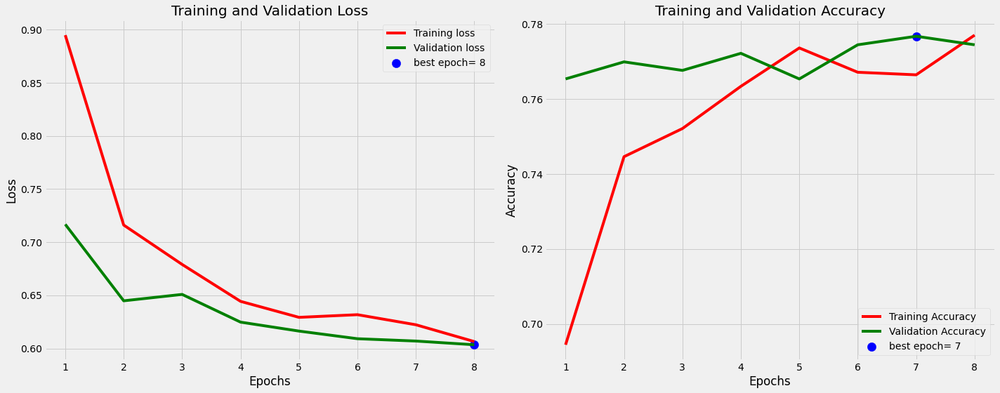

In [50]:
tr_acc = custom_history.history['accuracy']
tr_loss = custom_history.history['loss']
val_acc = custom_history.history['val_accuracy']
val_loss = custom_history.history['val_loss']

index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]
Epochs = [i+1 for i in range(len(tr_acc))]
loss_label = f'best epoch= {str(index_loss + 1)}'
acc_label = f'best epoch= {str(index_acc + 1)}'

plt.figure(figsize=(20, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs, tr_loss, 'r', label='Training loss')
plt.plot(Epochs, val_loss, 'g', label='Validation loss')
plt.scatter(index_loss + 1, val_lowest, s=150, c='blue', label=loss_label)
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs, tr_acc, 'r', label='Training Accuracy')
plt.plot(Epochs, val_acc, 'g', label='Validation Accuracy')
plt.scatter(index_acc + 1, acc_highest, s=150, c='blue', label=acc_label)
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

4/6 [===================>..........] - ETA: 0s - loss: 0.6536 - accuracy: 0.8047

In [ ]:
preds = model.predict_generator(test_gen)
# y_pred = np.argmax(preds, axis=1)

In [43]:
print(final_predictions)

[1 2 1 1 1 1 1 2 1 1 2 2 1 1 1 2 2 2 2 1 2 2 1 2 1 2 2 2 2 1 1 2 2 2 1 1 1
 2 2 2 2 1 1 1 1 1 2 1 2 1 1 2 2 2 2 1 2 2 2 1 2 2 1 1 2 1 2 1 2 1 2 2 2 1
 2 2 2 1 2 2 1 1 1 1 1 2 2 2 1 2 1 2 1 1 1 2 1 2 1 2 2 2 1 1 1 2 1 2 2 2 1
 2 1 2 2 2 1 1 1 2 2 2 1 1 2 2 1 1 1 1 2 2 2 1 1 2 1 1 1 1 1 1 2 1 2 1 2 2
 1 2 2 2 2 2 1 2 1 2 1 1 1 2 1 2 1 2 1 2 1 1 1 2 2 2 1 2 2 1 1 1 1 2 1 2 1
 2 2 1 2 1 2 1 2 2 1 2 2 1 1 2 1 2 2 2 1 2 1 1 2 1 2 2 1 1 2 2 1 2 2 1 1 1
 1 1 2 1 2 1 1 1 1 2 2 1 2 2 2 1 1 2 2 1 1 1 2 2 1 1 1 2 2 2 1 2 1 1 2 1 1
 2 2 1 1 1 2 1 2 2 2 2 2 2 2 1 1 2 1 2 1 1 1 1 1 1 1 2 2 1 2 2 2 1 1 1]


In [29]:
X_train = np.reshape(preds, (preds.shape[0], -1))
X_train, _, y_train, _ = train_test_split(X_train, test_gen.labels, train_size=0.8, random_state=42)

In [30]:
xgb_model = xgb.XGBClassifier(objective='multi:softmax', num_classes=class_count)
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_classes=5, num_parallel_tree=None, ...)

In [31]:
bagging_model = BaggingClassifier(base_estimator=xgb_model, n_estimators=10, max_samples=0.8)
bagging_model.fit(X_train, y_train)

BaggingClassifier(base_estimator=XGBClassifier(base_score=None, booster=None,
                                               callbacks=None,
                                               colsample_bylevel=None,
                                               colsample_bynode=None,
                                               colsample_bytree=None,
                                               device=None,
                                               early_stopping_rounds=None,
                                               enable_categorical=False,
                                               eval_metric=None,
                                               feature_types=None, gamma=None,
                                               grow_policy=None,
                                               importance_type=None,
                                               interaction_constraints=None,
                                               learning_rate=None, max_bin=None,
                                               max_cat_threshold=None,
                                               max_cat_to_onehot=None,
                                               max_delta_step=None,
                                               max_depth=None, max_leaves=None,
                                               min_child_weight=None,
                                               missing=nan,
                                               monotone_constraints=None,
                                               multi_strategy=None,
                                               n_estimators=None, n_jobs=None,
                                               num_classes=5,
                                               num_parallel_tree=None, ...),
                  max_samples=0.8)

In [32]:
X_test = np.reshape(preds, (preds.shape[0], -1))
bagging_predictions = bagging_model.predict(X_test)

In [33]:
accuracy = accuracy_score(test_gen.labels, bagging_predictions)
print(f"XGBoost Accuracy: {accuracy:.2f}")

XGBoost Accuracy: 0.68


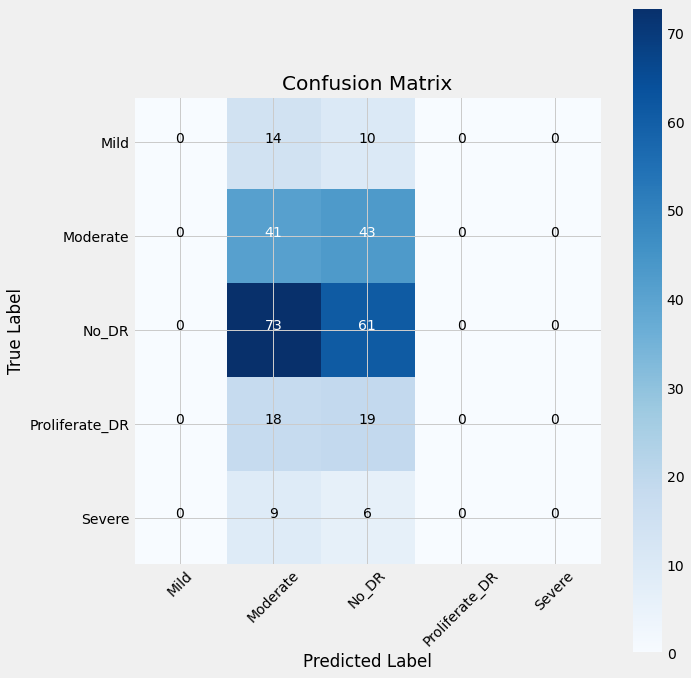

In [52]:
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, final_predictions)

plt.figure(figsize= (10, 10))
plt.imshow(cm, interpolation= 'nearest', cmap= plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()

tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation= 45)
plt.yticks(tick_marks, classes)

thresh = cm.max() / 2.
for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment= 'center', color= 'white' if cm[i, j] > thresh else 'black')

plt.tight_layout()
plt.ylabel('True Label')
plt.xlabel('Predicted Label')

plt.show()

In [54]:
print(classification_report(test_gen.classes, final_predictions, target_names= classes))

                precision    recall  f1-score   support

          Mild       0.00      0.00      0.00        24
      Moderate       0.26      0.49      0.34        84
         No_DR       0.44      0.46      0.45       134
Proliferate_DR       0.00      0.00      0.00        37
        Severe       0.00      0.00      0.00        15

      accuracy                           0.35       294
     macro avg       0.14      0.19      0.16       294
  weighted avg       0.28      0.35      0.30       294



In [55]:
model_name = model.input_names[0][:-6]
subject = 'Diabetic Retinopathy Detection'
acc = test_score[1] * 100

# Save model
save_id = str(f'{model_name}-{subject}-{"%.2f" %round(acc, 2)}.h5')
model_save_loc = os.path.join('', save_id)
model.save(model_save_loc)
print(f'model was saved as {model_save_loc}')

# Save weights
weight_save_id = str(f'{model_name}-{subject}-weights.h5')
weights_save_loc = os.path.join('', weight_save_id)
model.save_weights(weights_save_loc)
print(f'weights were saved as {weights_save_loc}')

model was saved as efficientnetb4-Diabetic Retinopathy Detection-70.83.h5
weights were saved as efficientnetb4-Diabetic Retinopathy Detection-weights.h5


In [56]:
class_dict = train_gen.class_indices
img_size = train_gen.image_shape
height = []
width = []
for _ in range(len(class_dict)):
    height.append(img_size[0])
    width.append(img_size[1])

Index_series = pd.Series(list(class_dict.values()), name= 'class_index')
Class_series = pd.Series(list(class_dict.keys()), name= 'class')
Height_series = pd.Series(height, name= 'height')
Width_series = pd.Series(width, name= 'width')
class_df = pd.concat([Index_series, Class_series, Height_series, Width_series], axis= 1)
csv_name = f'{subject}-class_dict_custom_model_4.csv'
csv_save_loc = os.path.join(save_path, csv_name)
class_df.to_csv(csv_save_loc, index= False)
print(f'class csv file was saved as {csv_save_loc}')

class csv file was saved as C:/Users/Aum Sathwara/Documents/Aum/Workplace/Python/PROJECTS/Deep Learning Project\Diabetic Retinopathy Detection-class_dict_custom_model_4.csv
